In [99]:
# !pip install neurodsp
# !pip install emd
# !pip install umap-learn
# !pip install -U kaleido

In [101]:
# Load required libraries
import numpy as np
import h5py
from scipy.io import loadmat
from scipy.signal import hilbert
from scipy.interpolate import interp1d
import matplotlib.pyplot as plt
import seaborn as sns
from neurodsp.filt import filter_signal, filter_signal_fir, design_fir_filter
import emd
import pandas as pd
from sklearn.preprocessing import Normalizer
from tqdm import tqdm
import plotly.express as px
import copy
import umap.umap_ as umap
from scipy.spatial import cKDTree
import pickle
import os

# Import custom functions
from scripts.functions import *

sns.set(style='white', context='notebook')

# Load data and get cycles

In [378]:
# Set path to LFP data and sleep state files
path_to_data = './data/OS_basic_separated/13/Rat_OS_Ephys_Rat13_344994_SD11_OR_N_06-07_06_2019/'
data_file = 'Cleaned_Trial1_PFC_100_CH63_0.continuous.mat'
states_file = '2019-06-06_11-44-01_post_trial1-states.mat'
pfc_data1, sleep_scoring1 = load_mat_data(path_to_data, data_file, states_file)

data_file = 'Cleaned_Trial2_PFC_100_CH63_0.continuous.mat'
states_file = '2019-06-06_12-34-54_post_trial2-states.mat'
pfc_data2, sleep_scoring2 = load_mat_data(path_to_data, data_file, states_file)

data_file = 'Cleaned_Trial3_PFC_100_CH63_0.continuous.mat'
states_file = '2019-06-06_13-26-20_post_trial3-states.mat'
pfc_data3, sleep_scoring3 = load_mat_data(path_to_data, data_file, states_file)

data_file = 'Cleaned_Trial4_PFC_100_CH63_0.continuous.mat'
states_file = '2019-06-06_14-17-32_post_trial4-states.mat'
pfc_data4, sleep_scoring4 = load_mat_data(path_to_data, data_file, states_file)

data_file = 'Cleaned_Trial5_PFC_100_CH63_0.continuous.mat'
states_file = '2019-06-06_15-39-11_post_trial5-states.mat'
pfc_data5, sleep_scoring5 = load_mat_data(path_to_data, data_file, states_file)

In [380]:
# def get_cycle_data(pfc_data, sleep_scoring, fs=2500):
#     cycle_data = {"fs": None, 'nrem_epochs': None, 'nrem_filtered_data': None,
#                        "IP": None, "IF": None, "IP": None, "cycles": None}
    
#     # Get filtered NREM LFP data
#     nrem_epochs = np.array(get_all_NREM_epochs(sleep_scoring))
#     if len(nrem_epochs) == 0:
#         return cycle_data
#     nrem_filtered_data, nrem_data = get_filtered_epoch_data(pfc_data, nrem_epochs, band=(0.1, 4), fs=fs)

#     # Get cycles using IP
#     IP, IF, IA = emd.spectra.frequency_transform(nrem_filtered_data, fs, 'hilbert')
#     C = emd.cycles.Cycles(IP)
#     cycles = get_cycles_with_metrics(C, nrem_filtered_data, IA, IF)
    
#     cycle_data['fs'] = fs
#     cycle_data['nrem_epochs'] = nrem_epochs
#     cycle_data['nrem_filtered_data'] = nrem_filtered_data
#     cycle_data['IP'] = IP
#     cycle_data['IF'] = IF
#     cycle_data['IA'] = IA
#     cycle_data['cycles'] = cycles
#     return cycle_data

In [382]:
def get_cycles_with_metrics(cycles, data, IA, IF, conditions=None):
  # C = copy.deepcopy(cycles)
  C.compute_cycle_timings()
    
  C.compute_cycle_metric('duration_samples', data, func=len)
  C.compute_cycle_metric('peak2trough', data, func=peak2trough)
  C.compute_cycle_metric('asc2desc', data, func=asc2desc)
  C.compute_cycle_metric('max_amp', IA, func=np.max)
  C.compute_cycle_metric('trough_values', data, func=np.min)
  C.compute_cycle_metric('peak_values', data, func=np.max)
  C.compute_cycle_metric('mean_if', IF, func=np.mean)
  C.compute_cycle_metric('max_if', IF, func=np.max)
  C.compute_cycle_metric('range_if', IF, func=compute_range)

  C.compute_cycle_metric('trough_position', data, func=np.argmin)
  C.compute_cycle_metric('peak_position', data, func=np.argmax)
  return C

In [384]:
fs = 2500
filtered_pfc_data1 = filter_signal(pfc_data1, fs, 'bandpass', (0.1, 4), n_cycles=3, filter_type='iir', butterworth_order=6, remove_edges=False)
IP1, IF1, IA1 = emd.spectra.frequency_transform(filtered_pfc_data1, fs, 'hilbert')
C = emd.cycles.Cycles(IP1)
cycles1 = get_cycles_with_metrics(C, filtered_pfc_data1, IA1, IF1)

filtered_pfc_data2 = filter_signal(pfc_data2, fs, 'bandpass', (0.1, 4), n_cycles=3, filter_type='iir', butterworth_order=6, remove_edges=False)
IP2, IF2, IA2 = emd.spectra.frequency_transform(filtered_pfc_data2, fs, 'hilbert')
C = emd.cycles.Cycles(IP2)
cycles2 = get_cycles_with_metrics(C, filtered_pfc_data2, IA2, IF2)

filtered_pfc_data3 = filter_signal(pfc_data3, fs, 'bandpass', (0.1, 4), n_cycles=3, filter_type='iir', butterworth_order=6, remove_edges=False)
IP3, IF3, IA3 = emd.spectra.frequency_transform(filtered_pfc_data3, fs, 'hilbert')
C = emd.cycles.Cycles(IP3)
cycles3 = get_cycles_with_metrics(C, filtered_pfc_data3, IA3, IF3)

filtered_pfc_data4 = filter_signal(pfc_data4, fs, 'bandpass', (0.1, 4), n_cycles=3, filter_type='iir', butterworth_order=6, remove_edges=False)
IP4, IF4, IA4 = emd.spectra.frequency_transform(filtered_pfc_data4, fs, 'hilbert')
C = emd.cycles.Cycles(IP4)
cycles4 = get_cycles_with_metrics(C, filtered_pfc_data4, IA4, IF4)

filtered_pfc_data5 = filter_signal(pfc_data5, fs, 'bandpass', (0.1, 4), n_cycles=3, filter_type='iir', butterworth_order=6, remove_edges=False)
IP5, IF5, IA5 = emd.spectra.frequency_transform(filtered_pfc_data5, fs, 'hilbert')
C = emd.cycles.Cycles(IP5)
cycles5 = get_cycles_with_metrics(C, filtered_pfc_data5, IA5, IF5)

C:\anaconda3\Lib\site-packages\neurodsp\filt\utils.py:90: RuntimeWarning:

divide by zero encountered in log10



 Checking Cycles inputs - trimming singleton from input 'IP'
 Checking Cycles inputs - trimming singleton from input 'IP'
 Checking Cycles inputs - trimming singleton from input 'IP'
 Checking Cycles inputs - trimming singleton from input 'IP'
 Checking Cycles inputs - trimming singleton from input 'IP'


In [385]:
# Subset good cycles
metrics1 = cycles1.get_metric_dataframe()
metrics2 = cycles2.get_metric_dataframe()
metrics3 = cycles3.get_metric_dataframe()
metrics4 = cycles4.get_metric_dataframe()
metrics5 = cycles5.get_metric_dataframe()
all_metrics = pd.concat([metrics1, metrics2, metrics3, metrics4, metrics5])

trough = 1
peak = 99
peak_thresh = np.percentile(all_metrics['peak_values'], peak)
trough_thresh = np.percentile(all_metrics['trough_values'], trough)

lo_freq_duration = 2500/0.5
hi_freq_duration = 2500/4

# Apply conditions to get good cycles
conditions_all_cycles = ['is_good==1',
                        f'peak_values<={peak_thresh}',
                        f'trough_values>={trough_thresh}',
                        f'duration_samples<{lo_freq_duration}',
                        f'duration_samples>{hi_freq_duration}']

In [386]:
cycles1 = get_cycles_with_conditions(cycles1, conditions_all_cycles)
cycles2 = get_cycles_with_conditions(cycles2, conditions_all_cycles)
cycles3 = get_cycles_with_conditions(cycles3, conditions_all_cycles)
cycles4 = get_cycles_with_conditions(cycles4, conditions_all_cycles)
cycles5 = get_cycles_with_conditions(cycles5, conditions_all_cycles)

In [387]:
cycles1

<class 'emd.cycles.Cycles'> (5099 cycles 2962 subset 1001 chains - 16 metrics) 

In [388]:
def get_cycle_state(sample_time, sleep_scoring, fs=2500):
    if sample_time//fs >= len(sleep_scoring):
        return sleep_scoring[sample_time//fs - 2]
    return sleep_scoring[sample_time//fs]

In [389]:
metrics1 = cycles1.get_metric_dataframe(subset=True)
metrics1['State'] = metrics1['stop_sample'].apply(get_cycle_state, sleep_scoring=sleep_scoring1)
metrics1['Post_Trial'] = 1

metrics2 = cycles2.get_metric_dataframe(subset=True)
metrics2['State'] = metrics2['stop_sample'].apply(get_cycle_state, sleep_scoring=sleep_scoring2)
metrics2['Post_Trial'] = 2

metrics3 = cycles3.get_metric_dataframe(subset=True)
metrics3['State'] = metrics3['stop_sample'].apply(get_cycle_state, sleep_scoring=sleep_scoring3)
metrics3['Post_Trial'] = 3

metrics4 = cycles4.get_metric_dataframe(subset=True)
metrics4['State'] = metrics4['stop_sample'].apply(get_cycle_state, sleep_scoring=sleep_scoring4)
metrics4['Post_Trial'] = 4

metrics5 = cycles5.get_metric_dataframe(subset=True)
metrics5['State'] = metrics5['stop_sample'].apply(get_cycle_state, sleep_scoring=sleep_scoring5)
metrics5['Post_Trial'] = 5

In [390]:
all_metrics = pd.concat([metrics1, metrics2, metrics3, metrics4, metrics5])

In [391]:
# Get phase-aligned cycle waveforms
waveforms1, _ = emd.cycles.phase_align(IP1, filtered_pfc_data1, cycles=cycles1.iterate(through='subset'), npoints=128)
waveforms1 = pd.DataFrame(waveforms1.T)

waveforms2, _ = emd.cycles.phase_align(IP2, filtered_pfc_data2, cycles=cycles2.iterate(through='subset'), npoints=128)
waveforms2 = pd.DataFrame(waveforms2.T)

waveforms3, _ = emd.cycles.phase_align(IP3, filtered_pfc_data3, cycles=cycles3.iterate(through='subset'), npoints=128)
waveforms3 = pd.DataFrame(waveforms3.T)

waveforms4, _ = emd.cycles.phase_align(IP4, filtered_pfc_data4, cycles=cycles4.iterate(through='subset'), npoints=128)
waveforms4 = pd.DataFrame(waveforms4.T)

waveforms5, _ = emd.cycles.phase_align(IP5, filtered_pfc_data5, cycles=cycles5.iterate(through='subset'), npoints=128)
waveforms5 = pd.DataFrame(waveforms5.T)

 Checking phase_align inputs - trimming singleton from input 'ip'
 Checking phase_align inputs - trimming singleton from input 'ip'
 Checking phase_align inputs - trimming singleton from input 'ip'
 Checking phase_align inputs - trimming singleton from input 'ip'
 Checking phase_align inputs - trimming singleton from input 'ip'


In [392]:
all_waveforms = pd.concat([waveforms1, waveforms2, waveforms3, waveforms4, waveforms5])

In [393]:
all_metrics['cycle_time'] = (all_metrics['start_sample']+all_metrics['stop_sample'])/(2*2500)
# metrics['section'] = pd.qcut(metrics.index, q=4, labels=[1, 2, 3, 4])

In [394]:
all_data = pd.concat([all_metrics, all_waveforms], axis=1)

## Save Data

In [396]:
all_data.to_hdf('all_data.h5', key='Rat_13', mode='a', format='table')

# Load Data

In [103]:
# Rat1_data = pd.read_hdf('all_data.h5', 'Rat_1')
# Rat3_data = pd.read_hdf('all_data.h5', 'Rat_3')
# Rat4_data = pd.read_hdf('all_data.h5', 'Rat_4')
# Rat6_data = pd.read_hdf('all_data.h5', 'Rat_6')
# Rat13_data = pd.read_hdf('all_data.h5', 'Rat_13')

In [181]:
rat = 'Rat_13'

In [183]:
Rat_data = pd.read_hdf('all_data.h5', rat)
metrics = Rat_data.iloc[:, :-128]
waveforms = np.array(Rat_data.iloc[:, -128:])

# UMAP

In [186]:
waveforms.shape

(22925, 128)

In [188]:
ID = np.round(np.nanmean(abids(waveforms, 50)))
ID

4.0

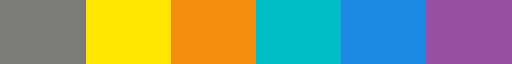

In [189]:
import matplotlib as mpl
cmap = mpl.colors.ListedColormap(["#7B7B7A", "#FFE701", "#F38F0D", "#00bfc4", "#1E88E5", "#984ea3"])
state_color_map = {
    0: "#7B7B7A",
    1: "#FFE701",
    2: "#F38F0D",
    3: "#00bfc4",
    4: "#1E88E5",
    5: "#984ea3",
}
cmap

In [190]:
umap_embedder = umap.UMAP(n_neighbors=15, min_dist=0.1, n_components=3, metric='euclidean', random_state=42)
embedding = umap_embedder.fit(waveforms)
emb = embedding.embedding_

C:\anaconda3\Lib\site-packages\umap\umap_.py:1945: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.



In [191]:
def get_section(start_sample, fs=2500):
    if start_sample/(fs*60) <= 45:
        return 1
    elif start_sample/(fs*60) <= 90:
        return 2
    elif start_sample/(fs*60) <= 135:
        return 3
    return 4

In [192]:
metrics['section'] = metrics['start_sample'].apply(get_section)

### 2D

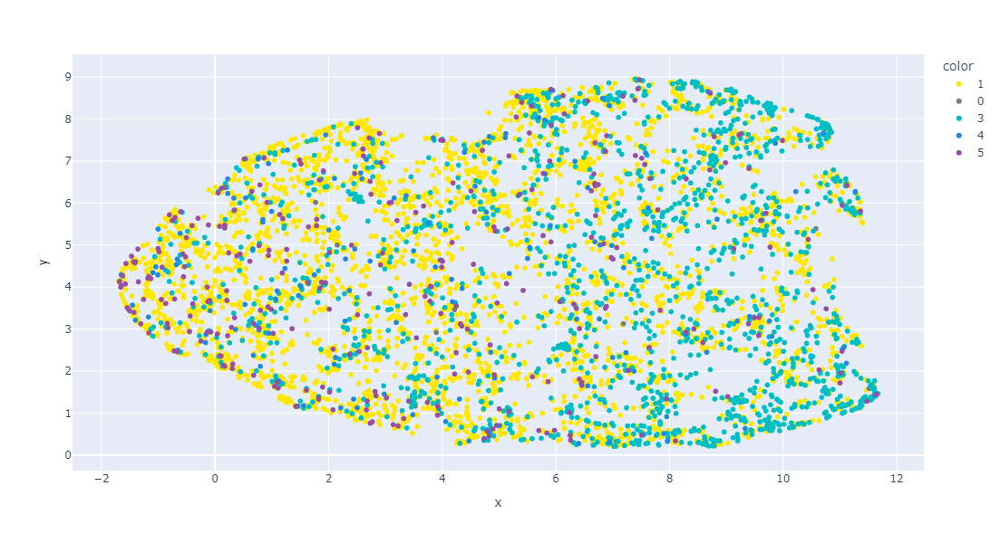

In [162]:
data = metrics
from plotly.graph_objs.layout import Scene
from plotly.graph_objs.layout.scene import XAxis, YAxis, ZAxis

fig = px.scatter(x=emb[:,0], y=emb[:,1],
              color=data['State'], color_discrete_map=state_color_map)

fig.update_layout(coloraxis_colorbar_title_text = 'State',
                 autosize=False,
                 width=800,
                 height=600,
                 scene=Scene(xaxis=XAxis(title='UMAP-1'),
                            yaxis=YAxis(title='UMAP-2'),
                            zaxis=ZAxis(title='UMAP-3')))
fig.show()
fig.write_html(f"./plots/UMAP-ORN-Whole/{rat}_ORN_embedding_1.html")
# fig.write_image("Rat6_ORN_3D_embedding.png", engine="kaleido")

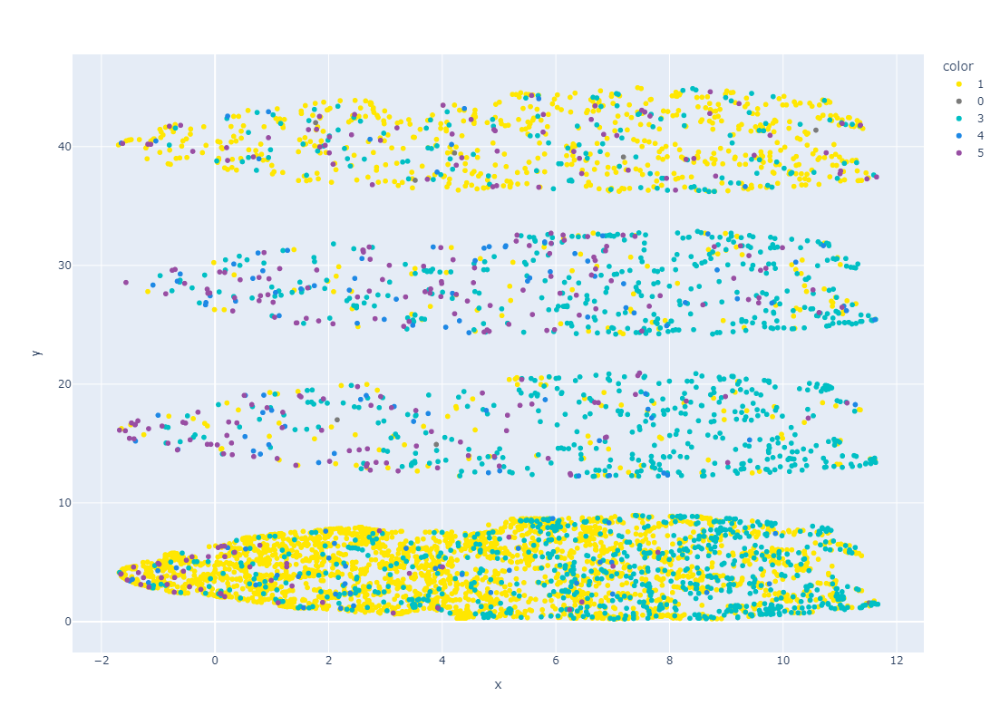

In [163]:
data = metrics

# Assign section based on start_sample and create z_offset using height_offsets
metrics['section'] = metrics['start_sample'].apply(get_section)
height_offsets = {1: 0, 2: 12, 3: 24, 4: 36}
data['y_offset'] = emb[:, 1] + np.array(data['section'].map(height_offsets))

state_color_map = {
    0: "#7B7B7A",
    1: "#FFE701",
    2: "#F38F0D",
    3: "#00bfc4",
    4: "#1E88E5",
    5: "#984ea3",
}


# Create the 3D scatter plot
fig = px.scatter(
    x=emb[:, 0], 
    y=data['y_offset'], 
    color=data['State'], 
    color_discrete_map=state_color_map
)

# Update layout
fig.update_layout(
    coloraxis_colorbar_title_text='State',
    autosize=False,
    width=800,
    height=800,
    scene=dict(
        xaxis=dict(title='UMAP-1'),
        yaxis=dict(title='UMAP-2')
    )
)

# Show and save the plot
fig.show()
fig.write_html(f"./plots/UMAP-ORN-Whole/{rat}_ORN_split_embedding_1.html")
# fig.write_image("Rat13_ORN_split_embedding.png", engine="kaleido")

### 3D

In [198]:
from plotly.graph_objs.layout import Scene
from plotly.graph_objs.layout.scene import XAxis, YAxis, ZAxis
import plotly.graph_objects as go

In [ ]:
# 3D plot of sleep states projected on UMAP
data = metrics

fig = px.scatter_3d(x=emb[:,0], y=emb[:,1], z=emb[:,2],
              color=data['State'], color_discrete_map=state_color_map)
fig.update_layout(autosize=False,
                 width=800,
                 height=600,
                 scene=Scene(xaxis=XAxis(title='UMAP-1'),
                            yaxis=YAxis(title='UMAP-2'),
                            zaxis=ZAxis(title='UMAP-3')),
                  
                 legend_title_text="State",
)
fig.show()
fig.write_html(f"./plots/UMAP-ORN-Whole/{rat}_ORN_PFC_embedding.html")
# fig.write_image("Rat6_ORN_PFC_3D_embedding.png", engine="kaleido")

In [ ]:
# Split 3D plot with projected sleep states
data = metrics

# Assign section based on start_sample and create z_offset using height_offsets
metrics['section'] = metrics['start_sample'].apply(get_section)
height_offsets = {1: 0, 2: 10, 3: 20, 4: 30}
data['z_offset'] = emb[:, 2] + np.array(data['section'].map(height_offsets))

fig = px.scatter_3d(
    x=emb[:, 0], 
    y=emb[:, 1], 
    z=data['z_offset'],
    color=data['State'], 
    color_discrete_map=state_color_map
)

for section, z_pos in height_offsets.items():
    fig.add_trace(
        go.Scatter3d(
            x=[-5], y=[10], z=[z_pos + 5],
            mode='text',
            text=f"{(section-1)*45} - {section*45} minutes",
            textfont=dict(size=12, color='black'),
            showlegend=False
        )
    )

fig.update_layout(
    coloraxis_colorbar_title_text='State',
    autosize=False,
    width=800,
    height=800,
    scene=dict(
        xaxis=dict(title='UMAP-1'),
        yaxis=dict(title='UMAP-2'),
        zaxis=dict(title='UMAP-3')
    ),
    legend_title_text="State"
)

fig.show()
fig.write_html(f"./plots/UMAP-ORN-Whole/{rat}_ORN_PFC_split_embedding.html")
# fig.write_image("Rat13_ORN_PFC_split_embedding.png", engine="kaleido")

In [ ]:
# 3D plots of features projected on UMAP
data = metrics

fig = px.scatter_3d(x=emb[:,0], y=emb[:,1], z=emb[:,2],
              color=data['peak2trough'])
fig.update_layout(autosize=False,
                  width=800,
                  height=600,
                  scene=Scene(xaxis=XAxis(title='UMAP-1'),
                            yaxis=YAxis(title='UMAP-2'),
                            zaxis=ZAxis(title='UMAP-3')),
                  coloraxis_colorbar_title='peak2trough',
                  coloraxis=dict(
                        cmin=np.percentile(data['peak2trough'], 5),  # Minimum value for the color scale (you can also use the 5th percentile if preferred)
                        cmax=np.percentile(data['peak2trough'], 95)  # Maximum value for the color scale (95th percentile)
                  )
)
fig.show()
fig.write_html(f"./plots/UMAP-ORN-Whole/{rat}_ORN_PFC_embedding_peak2trough.html")
# fig.write_image(f"{}_ORN_3D_embedding.png", engine="kaleido")

### 2D Feature Plots

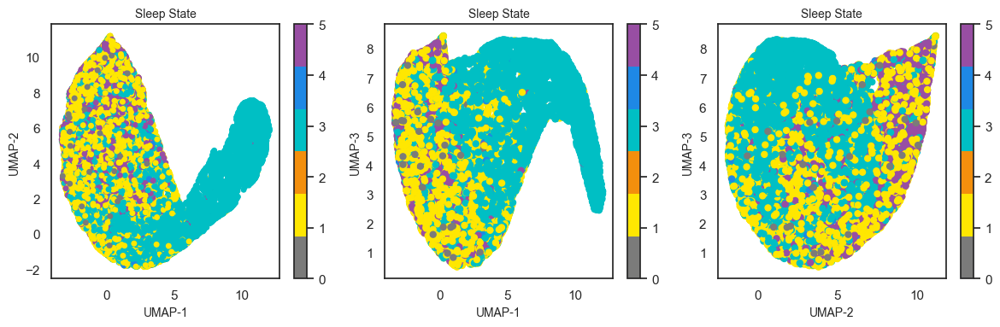

In [96]:
data = metrics

# cmap = plt.get_cmap('gist_rainbow', 6)
# cmap = mpl.colors.ListedColormap(["navy", "crimson", "limegreen", "gold"])
f, ax = plt.subplots(1,3, figsize=(12,4))
s = ax[0].scatter(emb[:,0], emb[:,1], c=data['State'],
            cmap=cmap, s=25, edgecolor ='none')
ax[0].set_xlabel('UMAP-1', fontsize=10)
ax[0].set_ylabel('UMAP-2', fontsize=10)
ax[0].set_title('Sleep State', fontsize=10)
f.colorbar(s, ax=ax[0])

s = ax[1].scatter(emb[:,0], emb[:,2], c=data['State'],
            cmap=cmap, s=25)
ax[1].set_xlabel('UMAP-1', fontsize=10)
ax[1].set_ylabel('UMAP-3', fontsize=10)
ax[1].set_title('Sleep State', fontsize=10)
f.colorbar(s, ax=ax[1])

s = ax[2].scatter(emb[:,1], emb[:,2], c=data['State'],
            cmap=cmap, s=25)
ax[2].set_xlabel('UMAP-2', fontsize=10)
ax[2].set_ylabel('UMAP-3', fontsize=10)
ax[2].set_title('Sleep State', fontsize=10)
f.colorbar(s, ax=ax[2])

plt.tight_layout()
# plt.savefig("./plots/UMAP-ORN-Whole/{rat}_ORN_PFC_2D_embedding.png")

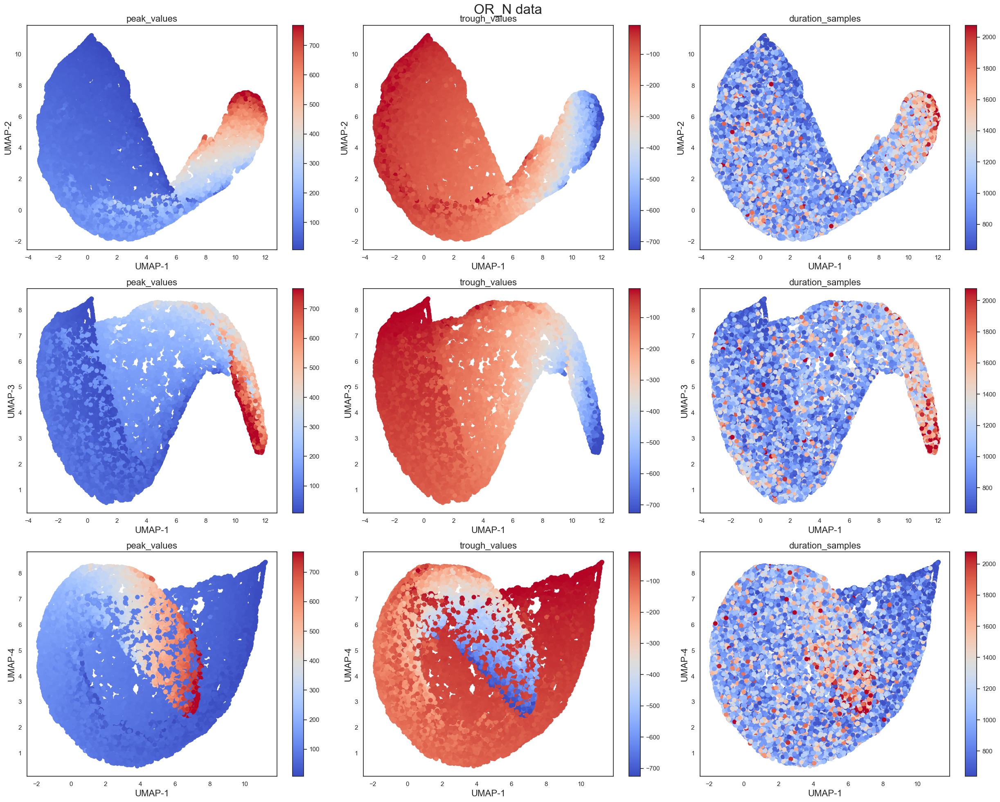

In [94]:
data = metrics

f, ax = plt.subplots(3,3, figsize=(25,20))
s = ax[0,0].scatter(emb[:,0], emb[:,1], c=data['peak_values'],
            vmin=np.percentile(data['peak_values'],1),
            vmax=np.percentile(data['peak_values'],99),
            cmap='coolwarm', s=50)
ax[0,0].set_xlabel('UMAP-1', fontsize=16)
ax[0,0].set_ylabel('UMAP-2', fontsize=16)
ax[0,0].set_title('peak_values', fontsize=16)
f.colorbar(s, ax=ax[0,0])

s = ax[0,1].scatter(emb[:,0], emb[:,1], c=data['trough_values'],
            vmin=np.percentile(data['trough_values'],1),
            vmax=np.percentile(data['trough_values'],99),
            cmap='coolwarm', s=50)
ax[0,1].set_xlabel('UMAP-1', fontsize=16)
ax[0,1].set_ylabel('UMAP-2', fontsize=16)
ax[0,1].set_title('trough_values', fontsize=16)
f.colorbar(s, ax=ax[0,1])

s = ax[0,2].scatter(emb[:,0], emb[:,1], c=data['duration_samples'],
            vmin=np.percentile(data['duration_samples'],1),
            vmax=np.percentile(data['duration_samples'],99),
            cmap='coolwarm', s=50)
ax[0,2].set_xlabel('UMAP-1', fontsize=16)
ax[0,2].set_ylabel('UMAP-2', fontsize=16)
ax[0,2].set_title('duration_samples', fontsize=16)
f.colorbar(s, ax=ax[0,2])
####################################################################

s = ax[1,0].scatter(emb[:,0], emb[:,2], c=data['peak_values'],
            vmin=np.percentile(data['peak_values'],1),
            vmax=np.percentile(data['peak_values'],99),
            cmap='coolwarm', s=50)
ax[1,0].set_xlabel('UMAP-1', fontsize=16)
ax[1,0].set_ylabel('UMAP-3', fontsize=16)
ax[1,0].set_title('peak_values', fontsize=16)
f.colorbar(s, ax=ax[1,0])

s = ax[1,1].scatter(emb[:,0], emb[:,2], c=data['trough_values'],
            vmin=np.percentile(data['trough_values'],1),
            vmax=np.percentile(data['trough_values'],99),
            cmap='coolwarm', s=50)
ax[1,1].set_xlabel('UMAP-1', fontsize=16)
ax[1,1].set_ylabel('UMAP-3', fontsize=16)
ax[1,1].set_title('trough_values', fontsize=16)
f.colorbar(s, ax=ax[1,1])

s = ax[1,2].scatter(emb[:,0], emb[:,2], c=data['duration_samples'],
            vmin=np.percentile(data['duration_samples'],1),
            vmax=np.percentile(data['duration_samples'],99),
            cmap='coolwarm', s=50)
ax[1,2].set_xlabel('UMAP-1', fontsize=16)
ax[1,2].set_ylabel('UMAP-3', fontsize=16)
ax[1,2].set_title('duration_samples', fontsize=16)
f.colorbar(s, ax=ax[1,2])
####################################################################

s = ax[2,0].scatter(emb[:,1], emb[:,2], c=data['peak_values'],
            vmin=np.percentile(data['peak_values'],1),
            vmax=np.percentile(data['peak_values'],99),
            cmap='coolwarm', s=50)
ax[2,0].set_xlabel('UMAP-1', fontsize=16)
ax[2,0].set_ylabel('UMAP-4', fontsize=16)
ax[2,0].set_title('peak_values', fontsize=16)
f.colorbar(s, ax=ax[2,0])

s = ax[2,1].scatter(emb[:,1], emb[:,2], c=data['trough_values'],
            vmin=np.percentile(data['trough_values'],1),
            vmax=np.percentile(data['trough_values'],99),
            cmap='coolwarm', s=50)
ax[2,1].set_xlabel('UMAP-1', fontsize=16)
ax[2,1].set_ylabel('UMAP-4', fontsize=16)
ax[2,1].set_title('trough_values', fontsize=16)
f.colorbar(s, ax=ax[2,1])

s = ax[2,2].scatter(emb[:,1], emb[:,2], c=data['duration_samples'],
            vmin=np.percentile(data['duration_samples'],1),
            vmax=np.percentile(data['duration_samples'],99),
            cmap='coolwarm', s=50)
ax[2,2].set_xlabel('UMAP-1', fontsize=16)
ax[2,2].set_ylabel('UMAP-4', fontsize=16)
ax[2,2].set_title('duration_samples', fontsize=16)
f.colorbar(s, ax=ax[2,2])
####################################################################

plt.suptitle("OR_N data", fontsize=24);
f.tight_layout()
# plt.savefig("./plots/UMAP-ORN-Whole/{rat}_ORN_PFC_2D_embedding_features.png")

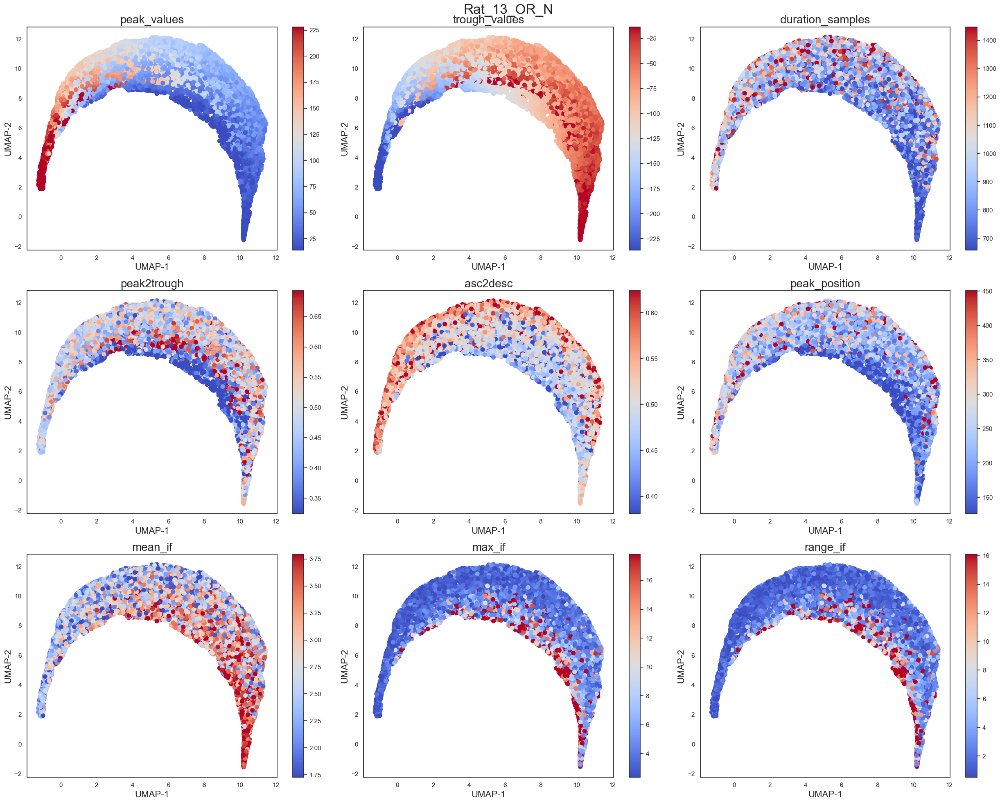

In [208]:
data = metrics

f, ax = plt.subplots(3,3, figsize=(25,20))

features = ['peak_values','trough_values','duration_samples', 'peak2trough', 'asc2desc', 'peak_position', 'mean_if', 'max_if','range_if']
feature_iter = iter(features)

for r in range(3):
    for c in range(3):
        feature = next(feature_iter)
        s = ax[r,c].scatter(emb[:,0], emb[:,1], c=data[feature],
            vmin=np.percentile(data[feature],5),
            vmax=np.percentile(data[feature],95),
            cmap='coolwarm', s=50)
        ax[r,c].set_xlabel('UMAP-1', fontsize=16)
        ax[r,c].set_ylabel('UMAP-2', fontsize=16)
        ax[r,c].set_title(feature, fontsize=20)
        f.colorbar(s, ax=ax[r,c])

plt.suptitle(f"{rat}_OR_N", fontsize=24);
f.tight_layout()
plt.savefig(f"./plots/UMAP-ORN-Whole/{rat}_ORN_PFC_2D_embedding_features.png")

## 4D Plots

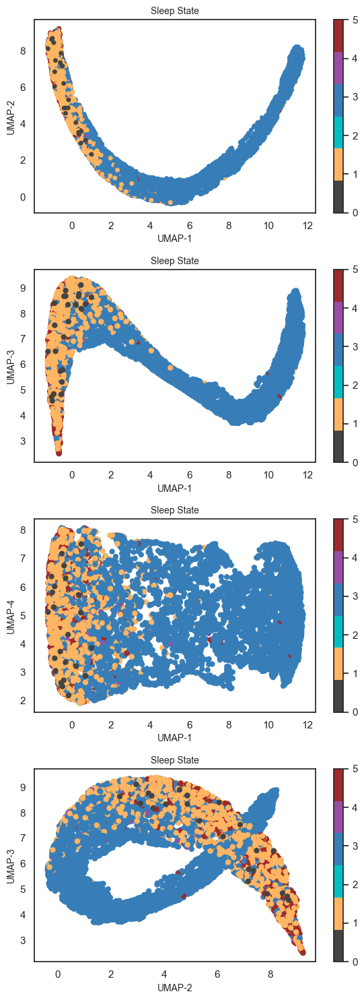

In [154]:
data = metrics

# cmap = plt.get_cmap('gist_rainbow', 6)
# cmap = mpl.colors.ListedColormap(["navy", "crimson", "limegreen", "gold"])
f, ax = plt.subplots(4,1, figsize=(6,15))
s = ax[0].scatter(emb[:,0], emb[:,1], c=data['State'],
            cmap=cmap, s=25, edgecolor ='none')
ax[0].set_xlabel('UMAP-1', fontsize=10)
ax[0].set_ylabel('UMAP-2', fontsize=10)
ax[0].set_title('Sleep State', fontsize=10)
f.colorbar(s, ax=ax[0])

s = ax[1].scatter(emb[:,0], emb[:,2], c=data['State'],
            cmap=cmap, s=25)
ax[1].set_xlabel('UMAP-1', fontsize=10)
ax[1].set_ylabel('UMAP-3', fontsize=10)
ax[1].set_title('Sleep State', fontsize=10)
f.colorbar(s, ax=ax[1])

s = ax[2].scatter(emb[:,0], emb[:,3], c=data['State'],
            cmap=cmap, s=25)
ax[2].set_xlabel('UMAP-1', fontsize=10)
ax[2].set_ylabel('UMAP-4', fontsize=10)
ax[2].set_title('Sleep State', fontsize=10)
f.colorbar(s, ax=ax[2])

s = ax[3].scatter(emb[:,1], emb[:,2], c=data['State'],
            cmap=cmap, s=25)
ax[3].set_xlabel('UMAP-2', fontsize=10)
ax[3].set_ylabel('UMAP-3', fontsize=10)
ax[3].set_title('Sleep State', fontsize=10)
f.colorbar(s, ax=ax[3]);

plt.tight_layout()
plt.savefig('whole_recording_umap.svg')
plt.savefig('whole_recording_umap.png')

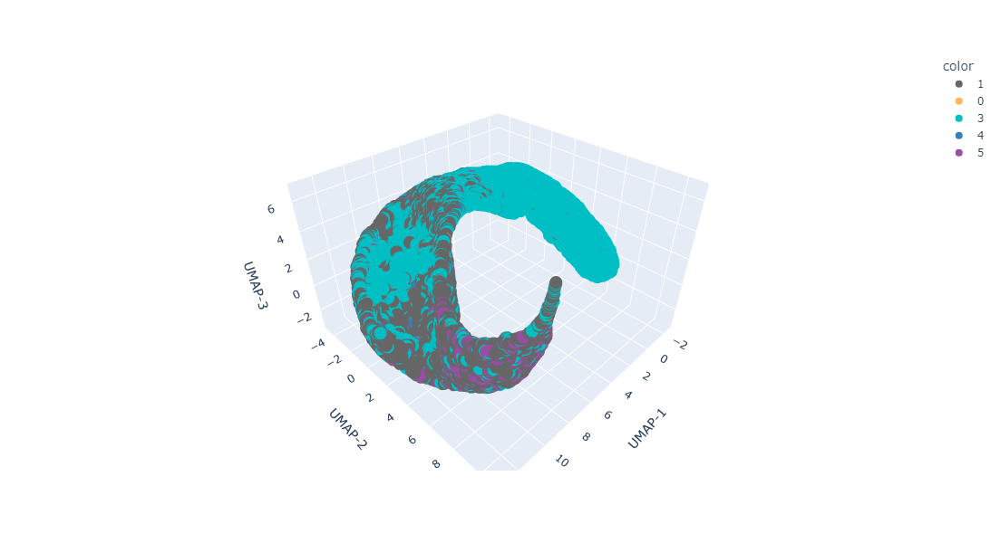

In [167]:
from plotly.graph_objs.layout import Scene
from plotly.graph_objs.layout.scene import XAxis, YAxis, ZAxis

fig = px.scatter_3d(x=emb[:,0], y=emb[:,1], z=emb[:,2],
              color=data['State'], color_discrete_sequence=["#666", "#FFB562", "#00bfc4", "#377eb8", "#984ea3", "#9e2a2b"])
fig.update_layout(coloraxis_colorbar_title_text = 'State',
                 autosize=False,
                 width=800,
                 height=600,
                 scene=Scene(xaxis=XAxis(title='UMAP-1'),
                            yaxis=YAxis(title='UMAP-2'),
                            zaxis=ZAxis(title='UMAP-3')))
fig.show()
# fig.write_html("./whole_recording.html")
# fig.write_image("whole_recording.png", engine="kaleido")

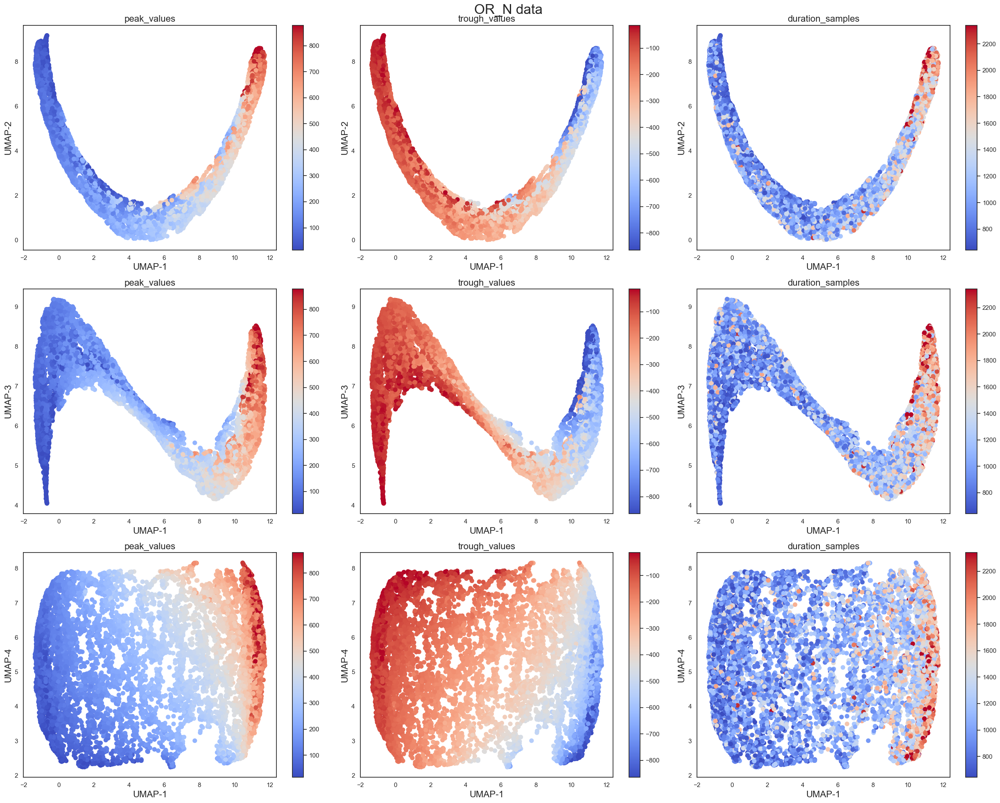

In [34]:
data = metrics

f, ax = plt.subplots(3,3, figsize=(25,20))
s = ax[0,0].scatter(emb[:,0], emb[:,1], c=data['peak_values'],
            vmin=np.percentile(data['peak_values'],1),
            vmax=np.percentile(data['peak_values'],99),
            cmap='coolwarm', s=50)
ax[0,0].set_xlabel('UMAP-1', fontsize=16)
ax[0,0].set_ylabel('UMAP-2', fontsize=16)
ax[0,0].set_title('peak_values', fontsize=16)
f.colorbar(s, ax=ax[0,0])

s = ax[0,1].scatter(emb[:,0], emb[:,1], c=data['trough_values'],
            vmin=np.percentile(data['trough_values'],1),
            vmax=np.percentile(data['trough_values'],99),
            cmap='coolwarm', s=50)
ax[0,1].set_xlabel('UMAP-1', fontsize=16)
ax[0,1].set_ylabel('UMAP-2', fontsize=16)
ax[0,1].set_title('trough_values', fontsize=16)
f.colorbar(s, ax=ax[0,1])

s = ax[0,2].scatter(emb[:,0], emb[:,1], c=data['duration_samples'],
            vmin=np.percentile(data['duration_samples'],1),
            vmax=np.percentile(data['duration_samples'],99),
            cmap='coolwarm', s=50)
ax[0,2].set_xlabel('UMAP-1', fontsize=16)
ax[0,2].set_ylabel('UMAP-2', fontsize=16)
ax[0,2].set_title('duration_samples', fontsize=16)
f.colorbar(s, ax=ax[0,2])
####################################################################

s = ax[1,0].scatter(emb[:,0], emb[:,2], c=data['peak_values'],
            vmin=np.percentile(data['peak_values'],1),
            vmax=np.percentile(data['peak_values'],99),
            cmap='coolwarm', s=50)
ax[1,0].set_xlabel('UMAP-1', fontsize=16)
ax[1,0].set_ylabel('UMAP-3', fontsize=16)
ax[1,0].set_title('peak_values', fontsize=16)
f.colorbar(s, ax=ax[1,0])

s = ax[1,1].scatter(emb[:,0], emb[:,2], c=data['trough_values'],
            vmin=np.percentile(data['trough_values'],1),
            vmax=np.percentile(data['trough_values'],99),
            cmap='coolwarm', s=50)
ax[1,1].set_xlabel('UMAP-1', fontsize=16)
ax[1,1].set_ylabel('UMAP-3', fontsize=16)
ax[1,1].set_title('trough_values', fontsize=16)
f.colorbar(s, ax=ax[1,1])

s = ax[1,2].scatter(emb[:,0], emb[:,2], c=data['duration_samples'],
            vmin=np.percentile(data['duration_samples'],1),
            vmax=np.percentile(data['duration_samples'],99),
            cmap='coolwarm', s=50)
ax[1,2].set_xlabel('UMAP-1', fontsize=16)
ax[1,2].set_ylabel('UMAP-3', fontsize=16)
ax[1,2].set_title('duration_samples', fontsize=16)
f.colorbar(s, ax=ax[1,2])
####################################################################

s = ax[2,0].scatter(emb[:,0], emb[:,3], c=data['peak_values'],
            vmin=np.percentile(data['peak_values'],1),
            vmax=np.percentile(data['peak_values'],99),
            cmap='coolwarm', s=50)
ax[2,0].set_xlabel('UMAP-1', fontsize=16)
ax[2,0].set_ylabel('UMAP-4', fontsize=16)
ax[2,0].set_title('peak_values', fontsize=16)
f.colorbar(s, ax=ax[2,0])

s = ax[2,1].scatter(emb[:,0], emb[:,3], c=data['trough_values'],
            vmin=np.percentile(data['trough_values'],1),
            vmax=np.percentile(data['trough_values'],99),
            cmap='coolwarm', s=50)
ax[2,1].set_xlabel('UMAP-1', fontsize=16)
ax[2,1].set_ylabel('UMAP-4', fontsize=16)
ax[2,1].set_title('trough_values', fontsize=16)
f.colorbar(s, ax=ax[2,1])

s = ax[2,2].scatter(emb[:,0], emb[:,3], c=data['duration_samples'],
            vmin=np.percentile(data['duration_samples'],1),
            vmax=np.percentile(data['duration_samples'],99),
            cmap='coolwarm', s=50)
ax[2,2].set_xlabel('UMAP-1', fontsize=16)
ax[2,2].set_ylabel('UMAP-4', fontsize=16)
ax[2,2].set_title('duration_samples', fontsize=16)
f.colorbar(s, ax=ax[2,2])
####################################################################

plt.suptitle("OR_N data", fontsize=24);
f.tight_layout()

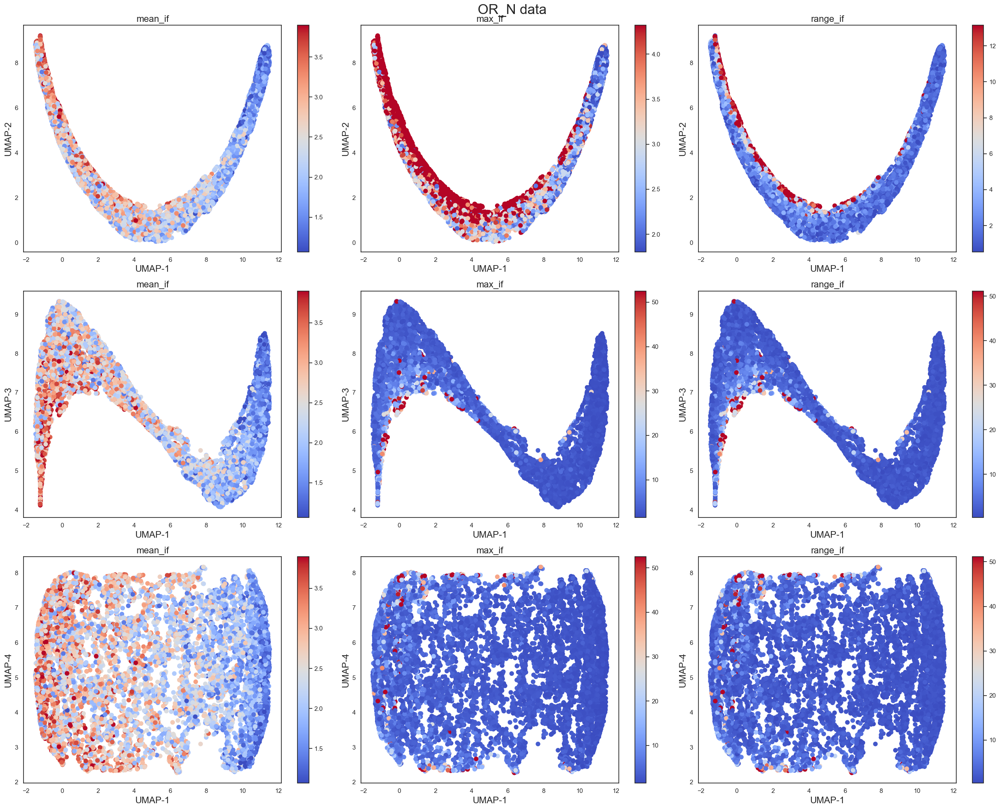

In [31]:
data = orn_data['ORN1_trials']

f, ax = plt.subplots(3,3, figsize=(25,20))
s = ax[0,0].scatter(emb[:,0], emb[:,1], c=data['mean_if'],
            vmin=np.percentile(data['mean_if'],1),
            vmax=np.percentile(data['mean_if'],99),
            cmap='coolwarm', s=50)
ax[0,0].set_xlabel('UMAP-1', fontsize=16)
ax[0,0].set_ylabel('UMAP-2', fontsize=16)
ax[0,0].set_title('mean_if', fontsize=16)
f.colorbar(s, ax=ax[0,0])

s = ax[0,1].scatter(emb[:,0], emb[:,1], c=data['max_if'],
            vmin=np.percentile(data['max_if'],5),
            vmax=np.percentile(data['max_if'],70),
            cmap='coolwarm', s=50)
ax[0,1].set_xlabel('UMAP-1', fontsize=16)
ax[0,1].set_ylabel('UMAP-2', fontsize=16)
ax[0,1].set_title('max_if', fontsize=16)
f.colorbar(s, ax=ax[0,1])

s = ax[0,2].scatter(emb[:,0], emb[:,1], c=data['range_if'],
            vmin=np.percentile(data['range_if'],5),
            vmax=np.percentile(data['range_if'],95),
            cmap='coolwarm', s=50)
ax[0,2].set_xlabel('UMAP-1', fontsize=16)
ax[0,2].set_ylabel('UMAP-2', fontsize=16)
ax[0,2].set_title('range_if', fontsize=16)
f.colorbar(s, ax=ax[0,2])
####################################################################

s = ax[1,0].scatter(emb[:,0], emb[:,2], c=data['mean_if'],
            vmin=np.percentile(data['mean_if'],1),
            vmax=np.percentile(data['mean_if'],99),
            cmap='coolwarm', s=50)
ax[1,0].set_xlabel('UMAP-1', fontsize=16)
ax[1,0].set_ylabel('UMAP-3', fontsize=16)
ax[1,0].set_title('mean_if', fontsize=16)
f.colorbar(s, ax=ax[1,0])

s = ax[1,1].scatter(emb[:,0], emb[:,2], c=data['max_if'],
            vmin=np.percentile(data['max_if'],1),
            vmax=np.percentile(data['max_if'],99),
            cmap='coolwarm', s=50)
ax[1,1].set_xlabel('UMAP-1', fontsize=16)
ax[1,1].set_ylabel('UMAP-3', fontsize=16)
ax[1,1].set_title('max_if', fontsize=16)
f.colorbar(s, ax=ax[1,1])

s = ax[1,2].scatter(emb[:,0], emb[:,2], c=data['range_if'],
            vmin=np.percentile(data['range_if'],1),
            vmax=np.percentile(data['range_if'],99),
            cmap='coolwarm', s=50)
ax[1,2].set_xlabel('UMAP-1', fontsize=16)
ax[1,2].set_ylabel('UMAP-3', fontsize=16)
ax[1,2].set_title('range_if', fontsize=16)
f.colorbar(s, ax=ax[1,2])
####################################################################

s = ax[2,0].scatter(emb[:,0], emb[:,3], c=data['mean_if'],
            vmin=np.percentile(data['mean_if'],1),
            vmax=np.percentile(data['mean_if'],99),
            cmap='coolwarm', s=50)
ax[2,0].set_xlabel('UMAP-1', fontsize=16)
ax[2,0].set_ylabel('UMAP-4', fontsize=16)
ax[2,0].set_title('mean_if', fontsize=16)
f.colorbar(s, ax=ax[2,0])

s = ax[2,1].scatter(emb[:,0], emb[:,3], c=data['max_if'],
            vmin=np.percentile(data['max_if'],1),
            vmax=np.percentile(data['max_if'],99),
            cmap='coolwarm', s=50)
ax[2,1].set_xlabel('UMAP-1', fontsize=16)
ax[2,1].set_ylabel('UMAP-4', fontsize=16)
ax[2,1].set_title('max_if', fontsize=16)
f.colorbar(s, ax=ax[2,1])

s = ax[2,2].scatter(emb[:,0], emb[:,3], c=data['range_if'],
            vmin=np.percentile(data['range_if'],1),
            vmax=np.percentile(data['range_if'],99),
            cmap='coolwarm', s=50)
ax[2,2].set_xlabel('UMAP-1', fontsize=16)
ax[2,2].set_ylabel('UMAP-4', fontsize=16)
ax[2,2].set_title('range_if', fontsize=16)
f.colorbar(s, ax=ax[2,2])
####################################################################

plt.suptitle("OR_N data", fontsize=24);
f.tight_layout()

In [37]:
random_indexes = np.random.choice(range(len(emb[:,0])), size=10000)

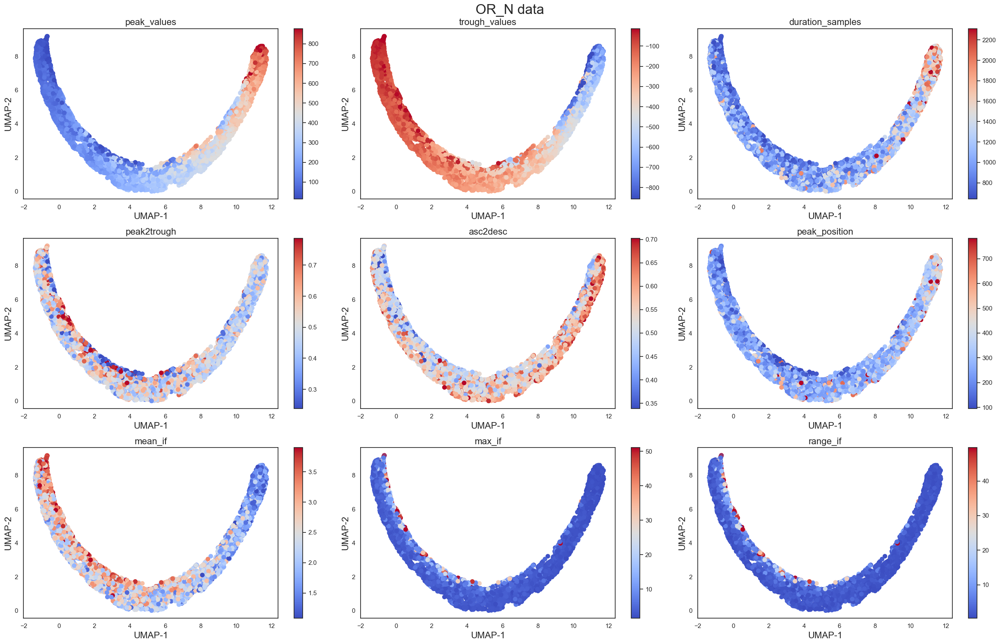

In [43]:
data = orn_data['ORN1_trials']

f, ax = plt.subplots(3,3, figsize=(25,16))

features = ['peak_values','trough_values','duration_samples', 'peak2trough', 'asc2desc', 'peak_position', 'mean_if', 'max_if','range_if']
feature_iter = iter(features)

for r in range(3):
    for c in range(3):
        feature = next(feature_iter)
        s = ax[r,c].scatter(emb[:,0][random_indexes], emb[:,1][random_indexes], c=data[feature].iloc[random_indexes],
            vmin=np.percentile(data[feature].iloc[random_indexes],1),
            vmax=np.percentile(data[feature].iloc[random_indexes],99),
            cmap='coolwarm', s=50)
        ax[r,c].set_xlabel('UMAP-1', fontsize=16)
        ax[r,c].set_ylabel('UMAP-2', fontsize=16)
        ax[r,c].set_title(feature, fontsize=16)
        f.colorbar(s, ax=ax[r,c])

plt.suptitle("OR_N data", fontsize=24);
f.tight_layout()

## Waveforms

In [209]:
# emb_data = pd.DataFrame(embedding.embedding_)
component = 1

In [210]:
low_embedding_indices = np.where(emb[:, component-1] <= np.percentile(emb[:, component-1], 15))[0]
low_waveforms = waveforms[low_embedding_indices]

high_embedding_indices = np.where(emb[:, component-1] >= np.percentile(emb[:, component-1], 85))[0]
high_waveforms = waveforms[high_embedding_indices]

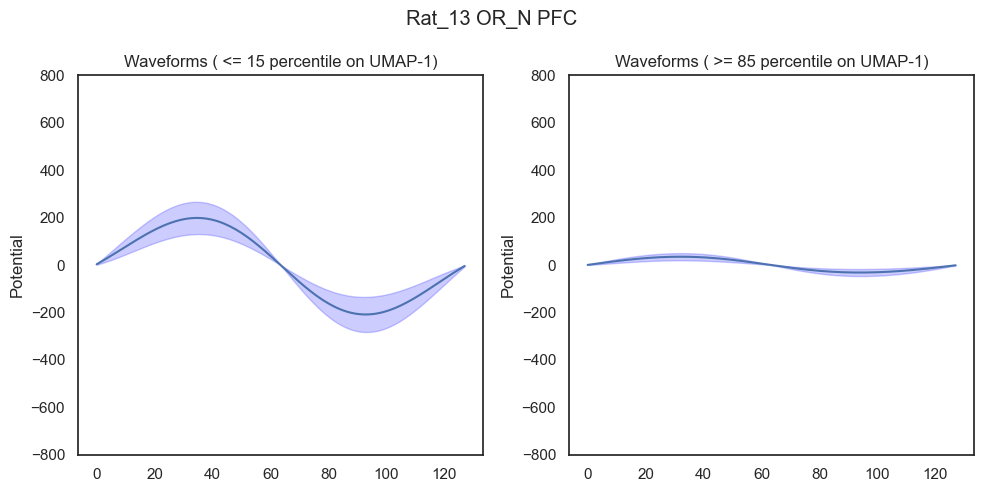

In [211]:
# Average waveforms
plt.figure(figsize=(10,5), facecolor='white')
plt.suptitle(f"{rat} OR_N PFC")
plt.subplot(1, 2, 1)

means = np.mean(low_waveforms, axis=0)
x_values = np.arange(len(means))
std = np.std(low_waveforms, axis=0)
lower_bound = np.array(means) - np.array(std)
upper_bound = np.array(means) + np.array(std)
sns.lineplot(means)
plt.fill_between(x_values, lower_bound, upper_bound, color='blue', alpha=0.2)
plt.ylabel('Potential')
plt.ylim(-800, 800)
plt.title(f'Waveforms ( <= 15 percentile on UMAP-{component})');

plt.subplot(1, 2, 2)
means = np.mean(high_waveforms, axis=0)
std = np.std(high_waveforms, axis=0)
lower_bound = np.array(means) - np.array(std)
upper_bound = np.array(means) + np.array(std)
sns.lineplot(means)
plt.fill_between(x_values, lower_bound, upper_bound, color='blue', alpha=0.2);
plt.ylabel('Potential')
plt.ylim(-800, 800)
plt.title(f'Waveforms ( >= 85 percentile on UMAP-{component})');
plt.tight_layout()
plt.savefig(f"./plots/UMAP-ORN-Whole/{rat}_ORN_PFC_waveforms.png")

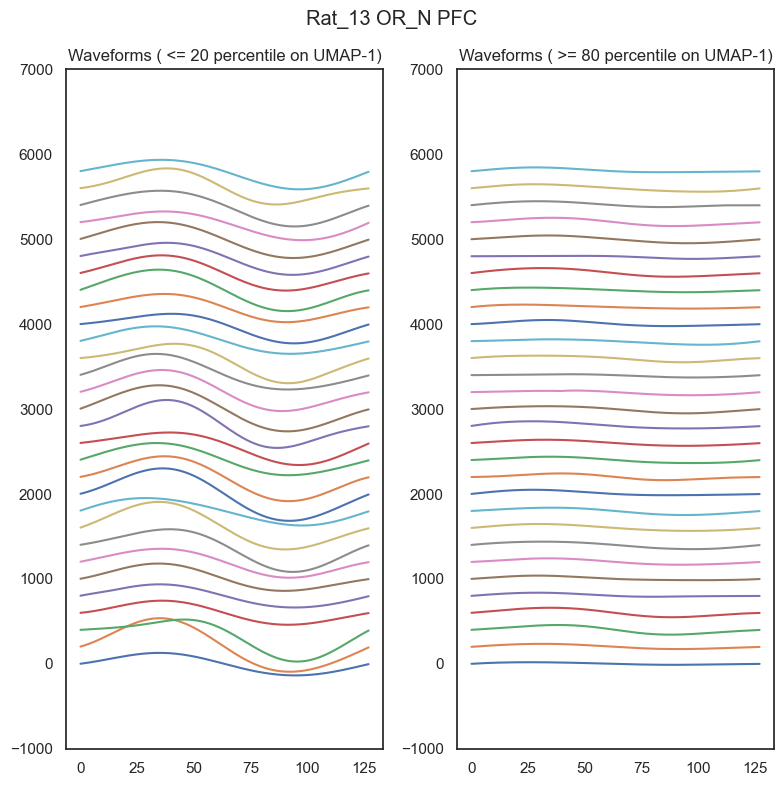

In [212]:
plt.figure(figsize=(8,8), facecolor='white')
plt.suptitle(f"{rat} OR_N PFC")
plt.subplot(1, 2, 1)
plt.title(f'Waveforms ( <= 20 percentile on UMAP-{component})')
start = 0
cycles_to_plot = np.random.randint(1, low_waveforms.shape[0], 30)
for i in cycles_to_plot:
  plt.plot(low_waveforms[i,:]+start)
  start += 200
plt.ylim((-1000, 7000))

plt.subplot(1, 2, 2)
plt.title(f'Waveforms ( >= 80 percentile on UMAP-{component})')
start = 0
cycles_to_plot = np.random.randint(1, high_waveforms.shape[0], 30)
for i in cycles_to_plot:
  plt.plot(high_waveforms[i,:]+start)
  start += 200
plt.ylim((-1000, 7000))

plt.tight_layout()
plt.savefig(f"./plots/UMAP-ORN-Whole/{rat}_ORN_PFC_waveform_examples.png")